# Advanced Lane Finding Project

This notebook lays out the process and code of advanced techniques in detecting lance from a camera. Here is the list of the overview of it:
1. Camera Calibration and Distortion Correction
2. Color and Gradient Threshold
3. Perspective Transform into Bird's Eye View
4. Finding Line and Lane Pixels
5. Measuring Curvature and Vehicle Position
6. Draw Lane on Original Image
7. The Pipeline for the Videos

## Import Packages

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

## Helper Functions

***

In [35]:
### CALIBRATION AND DISTORTION HELPER FUNCTIONS ###

# Define camera calibration function
def calibrate_camera(img_shape, objpoints, imgpoints):
    """
    A function to calibrate a camera. It returns calibration parameters.
    ___
    
    INPUTS:
        img_shape - An iterable where the shape of the iamge to be undistorted is passed
    OUTPUTS:
        ret - A boolean value indicating whether calibration is successful
        mtx - Camera matrix
        dist - Distortion coefficients
        rvecs - Rotation vectors
        tvecs - Translation vectors
    """
    # Obtain calibration parameters
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_shape[1::-1], None, None)
    return ret, mtx, dist, rvecs, tvecs

# Define drawing corners function
def draw_corners(img, nx, ny, corners, ret):
    """
    A function to draw chessboard corners on a calibration image.
    ___
    
    INPUT:
        img - An image object to be drawn on
        nx - An integer of the number or corners in the calibration image chessboard row
        ny - An integer of the number of corners in the calibration image chessboard columns
        corners - An object containing corners coordinate on the image
        ret - A boolean indicating whether calibration is successful
    OUTPUT:
        img_draw - An image with chessboard corners drawn
    """
    img_draw = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
    return img_draw

# Define undistort image function
def undistort(img, mtx, dist):
    """
    A function to undistort images with the calibration parameters in the input.
    ___
    
    INPUTS:
        img - An image object to be undistorted
        mtx - An object of camera matrix
        dist - An object of distortion coefficients
    OUTPUT:
        undist - An undistorted image object
    """
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

### GRADIENT AND COLOR THRESHOLD HELPER FUNCTIONS ###

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    """
    INPUT:
        img - An image object to be thresholded
        orient - A string of either 'x' or 'y' to determine whether to run sobel on the X axis or Y axis
        sobel_kernel - An integer for the size of the kernel
        thresh - A tuple of integers for the threshold magnitude
    OUPUT:
        grad_binary - A binary image object of the threshold product
    """
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Take the derivative in x or y given orient = 'x' or 'y'
    if (orient == 'x'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    # Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # Create a mask of 1's where the scaled gradient magnitude 
    # is > thresh_min and < thresh_max
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    # Return this mask as your binary_output image
    return grad_binary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    """
    Apply sobel to both X and Y axis.
    ___
    
    INPUTS:
        img - An image object to be thresholded
        sobel_kernel - An integer for the size of the kernel
        mag_thresh - A tuple of integers for the threshold magnitude
    OUTPUT:
        mab_binary - A binary image object of the threshold product
    """
    # Calculate gradient magnitude
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Calculate the magnitude
    grad_mag = np.sqrt(sobelx**2 + sobely**2)
    
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    grad_mag = np.uint8(255*grad_mag/np.max(grad_mag))
    
    # Create a binary mask where mag thresholds are met
    mag_binary = np.zeros_like(grad_mag)
    mag_binary[(grad_mag >= mag_thresh[0]) & (grad_mag <= mag_thresh[1])] = 1
    
    # Return this mask as your binary_output image
    return mag_binary

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    """
    INPUTS:
        img - An image object to be thresholded
        sobel_kernel - An integer for the size of the kernel
        thresh - A tuple of floats of radians for thresholding parameters
    OUTPUTS:
        dir_binary - A binary image object of the threshold product
    """
    # Calculate gradient direction
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    # Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    
    # Create a binary mask where direction thresholds are met
    dir_binary = np.zeros_like(grad_dir)
    dir_binary[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    
    # Return this mask as your binary_output image
    return dir_binary

def hls_select(img, thresh=(0, 255)):
    """
    Filter saturation channel on an image.
    ___
    
    INPUTS:
        img - An image object to be thresholded
    OUTPUT:
        binary_output - A binary image object of the thresholded product
    """
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    # Apply a threshold to the S channel
    S = hls[:,:,2]
    binary_output = np.zeros_like(S)
    binary_output[(S > thresh[0]) & (S <= thresh[1])] = 1
    
    # Return a binary image of threshold result
    return binary_output

### PERSPECTIVE TRANSFORM HELPER FUNCTIONS ###

def getTransformMatrix(img, src, dst):
    """
    Obtain a transformation matrix for perspective transform.
    ___
    
    INPUT:
        img - An image object to be transformed
        src - An iterable object containing points in the image
        dst - An iterable object containing points of the image in the supposed perspective transformed image
    OUTPUT:
        M - A transformation matrix for perspective transform
    """
    img_size = img.shape[:2]
    # Use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    
    return M

def transformPerspective(img, M):
    """
    Apply perspective transform, given an image and a transformation matrix.
    ___
    
    INPUT:
        img - An image object to be transformed
        M - A transformation matrix
    OUTPUT:
        warped - An imabe object, a product of perspective transformation
    """
    img_size = img.shape[:2]
    # Use cv2.warpPerspective() to warp image to a bird's eye view
    warped = cv2.warpPerspective(img, M, img_size[::-1], flags=cv2.INTER_LINEAR)
    return warped

### FINDING LANE LINE HELPER FUNCTIONS ###

def draw_window(img, win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high):
    """
    Draw area/window where the sliding windows function searches.
    ___
    
    INPUT:
        img - An image object to be drawn on
        win_y_low - An integer of bottom Y coordinate of the window
        win_y_high - An integer of top Y coordinate of the window
        win_xleft_low - An integer of left X coordinate of the left lane window
        win_xleft_high - An integer of the right X coordinate of the left lane window
        win_xright_low - An integer of the left X coordinate of the right lane window
        win_xright_high - An integer of the right X coordinate of the right lane window
    OUPUT:
        img - An image object drawn with the windows
    """
    # Draw the windows on the visualization image
    cv2.rectangle(img,(win_xleft_low,win_y_low),\
                  (win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(img,(win_xright_low,win_y_low),\
                  (win_xright_high,win_y_high),(0,255,0), 2) 
    
    return img

def draw_road(img, left_fitx, right_fitx):
    """
    Draw where the road is, given the left and right polynomial X values.
    ___
    
    INPUT:
        img - An image object to be drawn on
        left_fitx - An iterable containing X coordinates of the fitted left lane
        right_fitx - An iterable containing X coordinates of the fitted right lane
    OUPUT:
        img - An image object with the road drawn in green
    """
    # Generate y values
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the road onto the image
    cv2.fillPoly(img, np.int_([pts]), (0,255, 0))
    
    return img

def draw_lane_px(img, leftx, lefty, rightx, righty):
    """
    Draw lanes on the image: left lane in red and right lane in blue.
    ___
    
    INPUT:
        img - An image object to be drawn on
        leftx - An iterable of the X coordinates of the left lane
        lefty - An iterable of the Y coordinates of the left lane
        rightx - An iterable of the X coordinates of the right lane
        righty - An iterable of the Y coordinates of the right lane
    OUTPUT:
        img - An image object with the lanes drawn
    """
    # Colors in the left and right lane regions
    img[lefty, leftx] = [255, 0, 0]
    img[righty, rightx] = [0, 0, 255]
    
    return img

def draw_fit_lines(img, left_fitx, right_fitx):
    """
    Draw fitted lane lines on an image.
    ___
    
    INPUT:
        img - An image object to be drawn on
        left_fitx - An iterable of X coordinates of fitted left lane
        right_fitx - An iterable of X coordinates of fitted right lane
    OUTPUT:
        img - An image object with fitted lines drawn
    """
    # Generate y values
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    
    # Draw polynomial lane lines on the image
    ## Draw on the left lane
    draw_points_left = np.asarray([left_fitx, ploty]).T.astype(np.int32)    # needs to be int32 and transposed
    cv2.polylines(img, [draw_points_left], False, (255,255,0), 3)  # args: image, points, closed, color (BGR), thickness
    ## Draw on the right lane
    draw_points_right = np.asarray([right_fitx, ploty]).T.astype(np.int32)    # needs to be int32 and transposed
    cv2.polylines(img, [draw_points_right], False, (255,255,0), 3)  # args: image, points, closed, color (BGR), thickness
    
    return img

def sw_find_lane_with_window(binary_warped, left, right):
    """
    Find left and right lanes with sliding window algorithm on a binary filtered image.
    Also output an image with the windows search area drawn.
    ___
    
    INPUT:
        binary_warped - A binary image object
        left - A line object to save the left lane pixels
        right - A line object to save the right lane pixels
    OUTPUT:
        left - A line object of which the left lane pixels are saved
        right - A line object of which the right lane pixels are saved
        out_img - An image object where the windows are drawn
    """
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Create an output image to draw on and visualize the result
    out_img = np.uint8(np.dstack((binary_warped, binary_warped, binary_warped))*255)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        
        # Find the four below boundaries of the window
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        out_img = draw_window(out_img, win_y_low, win_y_high,\
                              win_xleft_low, win_xleft_high,\
                              win_xright_low, win_xright_high)
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &\
                        (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &\
                        (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window
        # (`right` or `leftx_current`) on their mean position
        ## For the left line
        if (len(good_left_inds) > minpix):
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        ## For the right line
        if (len(good_right_inds) > minpix):
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    left.allx = nonzerox[left_lane_inds]
    left.ally = nonzeroy[left_lane_inds] 
    right.allx = nonzerox[right_lane_inds]
    right.ally = nonzeroy[right_lane_inds]

    return left, right, out_img

## Define sliding window function with window drawings
def sw_find_lane_pixel(binary_warped, left, right):
    """
    Find left and right lanes with sliding window algorithm on a binary filtered image.
    ___
    
    INPUT:
        binary_warped - A binary image object
        left - A line object to save the left lane pixels
        right - A line object to save the right lane pixels
    OUTPUT:
        left - A line object of which the left lane pixels are saved
        right - A line object of which the right lane pixels are saved
    """
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        
        # Find the four below boundaries of the window
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
                
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &\
                        (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &\
                        (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window
        # (`right` or `leftx_current`) on their mean position
        ## For the left line
        if (len(good_left_inds) > minpix):
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        ## For the right line
        if (len(good_right_inds) > minpix):
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    left.allx = nonzerox[left_lane_inds]
    left.ally = nonzeroy[left_lane_inds] 
    right.allx = nonzerox[right_lane_inds]
    right.ally = nonzeroy[right_lane_inds]

    return left, right

def fit_poly(img_shape, left, right):
    """
    Save fitted lines given lane pixels found.
    ___
    
    INPUT:
        img_shape - An interable containing the original image shape
        left - A line object containing the lane pixels of the left lane
        right - A line object containing the lane pixels of the right lane
    OUTPUT:
        left - A line object where the X coordinates of the fitted line of the left lane is saved
        right - A line object where the X coordinates of the fitted line of the right lane is saved
    
    """
    # Fit a second order polynomial to each with np.polyfit()
    left.current_fit = np.polyfit(left.ally, left.allx, 2)
    right.current_fit = np.polyfit(right.ally, right.allx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    
    # Calc both polynomials using ploty, left_fit and right_fit
    try:
        left.current_fitx = left.current_fit[0]*ploty**2 + left.current_fit[1]*ploty + left.current_fit[2]
        right.current_fitx = right.current_fit[0]*ploty**2 + right.current_fit[1]*ploty + right.current_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left.current_fitx = 1*ploty**2 + 1*ploty
        left.current_fitx = 1*ploty**2 + 1*ploty
    
    return left, right

## Original function for the pipeline of finding lane, but with no line objects ##
# # Define fit polynomial with not returning image with sliding windows drawn
# def fit_polynomial(binary_warped):
#     # Create an output image to draw on and visualize the result
#     ## out_img as a blank black image for the lane line to be drawn on
#     warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
#     out_img = np.dstack((warp_zero, warp_zero, warp_zero))
#     ## window_img as blank black image for the lane to be drawn on
#     window_img = np.zeros_like(out_img)
    
#     # Find our lane pixels first
#     leftx, lefty, rightx, righty = sw_find_lane_pixel(binary_warped)

#     # Generate x and y values for plotting
#     left_fit, right_fit, left_fitx, right_fitx, ploty = fit_poly(out_img.shape, leftx, lefty, rightx, righty)
    
#     # Find curvature and offset
#     left_curverad, right_curverad = measure_curvature_real(leftx, lefty, rightx, righty)
#     offset = vehicle_offset(out_img.shape, left_fit, right_fit)

#     # Visualization 
#     out_img = draw_lane_px(out_img, leftx, lefty, rightx, righty) # Colors in the left and right lane regions
#     window_img = draw_road(window_img, left_fitx, right_fitx) # Draw the road
#     result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0) # Overlay the road image onto the warped lane image

#     return result, left_fit, right_fit, left_curverad, right_curverad, offset

def search_around_poly(binary_warped, left, right):
    """
    Search lane pixels around previously found fitted line.
    ___
    
    INPUTS:
        binary_warped - A binary image object to search the lanes on
        left - A line object to save left lane pixels and the new fitted line
        left - A line object to save right lane pixels and the new fitted line
    OUTPUTS:
        left - A line object of the left lane
        right - A line object of the right lane
    """
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Set the area of search based on activated x-values
    # within the +/- margin of our polynomial function
    
    # Handling if no Line.best_fit, use the Line.current_fit
    try:
        left_lane_inds = ((nonzerox >= (left.best_fit[0]*nonzeroy**2 + left.best_fit[1]*nonzeroy + left.best_fit[2]) - margin) &\
                        (nonzerox < (left.best_fit[0]*nonzeroy**2 + left.best_fit[1]*nonzeroy + left.best_fit[2]) + margin)).nonzero()[0]
        right_lane_inds = ((nonzerox >= (right.best_fit[0]*nonzeroy**2 + right.best_fit[1]*nonzeroy + right.best_fit[2]) - margin) &\
                        (nonzerox < (right.best_fit[0]*nonzeroy**2 + right.best_fit[1]*nonzeroy + right.best_fit[2]) + margin)).nonzero()[0]
    except:
        left_lane_inds = ((nonzerox >= (left.current_fit[0]*nonzeroy**2 + left.current_fit[1]*nonzeroy + left.current_fit[2]) - margin) &\
                        (nonzerox < (left.current_fit[0]*nonzeroy**2 + left.current_fit[1]*nonzeroy + left.current_fit[2]) + margin)).nonzero()[0]
        right_lane_inds = ((nonzerox >= (right.current_fit[0]*nonzeroy**2 + right.current_fit[1]*nonzeroy + right.current_fit[2]) - margin) &\
                        (nonzerox < (right.current_fit[0]*nonzeroy**2 + right.current_fit[1]*nonzeroy + right.current_fit[2]) + margin)).nonzero()[0]
    
    # Again, extract left and right line pixel positions
    left.allx = nonzerox[left_lane_inds]
    left.ally = nonzeroy[left_lane_inds] 
    right.allx = nonzerox[right_lane_inds]
    right.ally = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left, right = fit_poly(binary_warped.shape, left, right)
    
    return left, right

### CURVATURE AND POSITION HELPER FUNCTIONS ###
def draw_curv_pos_text(img, left_curverad, right_curverad, offset):
    """
    Annotate text of curvature and vehicle position information on the image.
    ___
    
    INPUTS:
        img - An image object to be drawn on
        left_curverad - A float of curvature degree in radian of the left fitted line
        right_curverad - A float of curvature degree in radian of the right fitted line
        offset = A vehicle position in regards to the center of the lane road
    OUTPUT:
        img - An image object which the curvature and vehicle position are annotated
    """
    
    # Set annotation format
    mean_curverad = int((left_curverad + right_curverad) // 2) # The mean of left and right curvature
    curvature_str = 'Radius of Curvature = ' + str(mean_curverad) + '(m)'

    # Set offset string
    if offset < 0:
        offset_str = 'Vehicle is ' + str(format(abs(offset), '.2f')) + 'm left of center'
    else:
        offset_str = 'Vehicle is ' + str(format(abs(offset), '.2f')) + 'm right of center'
    font = cv2.FONT_HERSHEY_SIMPLEX
    upperLeftCornerOfText1 = (200, 50)
    upperLeftCornerOfText2 = (200, 100)
    fontScale = 1.5
    fontColor = (255,255,255)
    lineType = 2

    # Annotate curvature and offset on the image
    cv2.putText(img, curvature_str, upperLeftCornerOfText1, font, fontScale, fontColor, lineType)
    cv2.putText(img, offset_str, upperLeftCornerOfText2, font, fontScale, fontColor, lineType)
    
    return img

def measure_curvature_real(left, right):
    '''
    Calculates the curvature of polynomial functions in meters.
    ___
    
    INPUTS:
        left - A line object of the left lane
        right - A line object of the right lane
    OUTPUTS:
        left - A line object of the left lane where the curvature information is saved
        right - A line object of the right lane where the curvature information is saved
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Fit a second order polynomial to pixel positions in each fake lane line
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(left.ally*ym_per_pix, left.allx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(right.ally*ym_per_pix, right.allx*xm_per_pix, 2)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = 719 # Since the image is 720px tall
    
    ## Implement the calculation of R_curve (radius of curvature)
    left.radius_of_curvature = (1+(2*left_fit_cr[0]*y_eval*ym_per_pix+left_fit_cr[1])**2)**(3/2)/\
                    (2*left_fit_cr[0])
    right.radius_of_curvature = (1+(2*right_fit_cr[0]*y_eval*ym_per_pix+right_fit_cr[1])**2)**(3/2)/\
                    (2*right_fit_cr[0])
    
    return left, right

def vehicle_offset(img_size, left, right):
    """
    Calculate the position of the vehicle in relation to the lane.
    ___
    
    INPUTS:
        img_size - An interable containing the size of the original image shape
        left - A line object of the left lane
        right - A line object of the right lane
    OUTPUTS:
        left - A line object where the position is saved
        right - A line object where the position is saved
        offset - A float of the vehicle position in relation to the center of the lane
    """
    # Define conversions in x and y from pixels space to meters
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Calculate car position
    vehicle_x = (img_size[1]//2)
    
    # Calculate lane midpoint
    y = img_size[0]
    left_x = left.current_fit[0]*(y**2) + left.current_fit[1]*y + left.current_fit[2]
    right_x = right.current_fit[0]*(y**2) + right.current_fit[1]*y + right.current_fit[2]
    midpoint = ((right_x - left_x)//2) + left_x
    
    # Calculate offset
    left.line_base_pos = (vehicle_x - left_x) * xm_per_pix
    right.line_base_pos = (right_x - vehicle_x) * xm_per_pix
    offset = (vehicle_x - midpoint) * xm_per_pix # Positive value means offset to the right and vice versa
    
    return left, right, offset



## 1. Camera Calibration and Test Images Undistortion

***

### Obtain Calibration Parameters and Draw Chessboard Corners

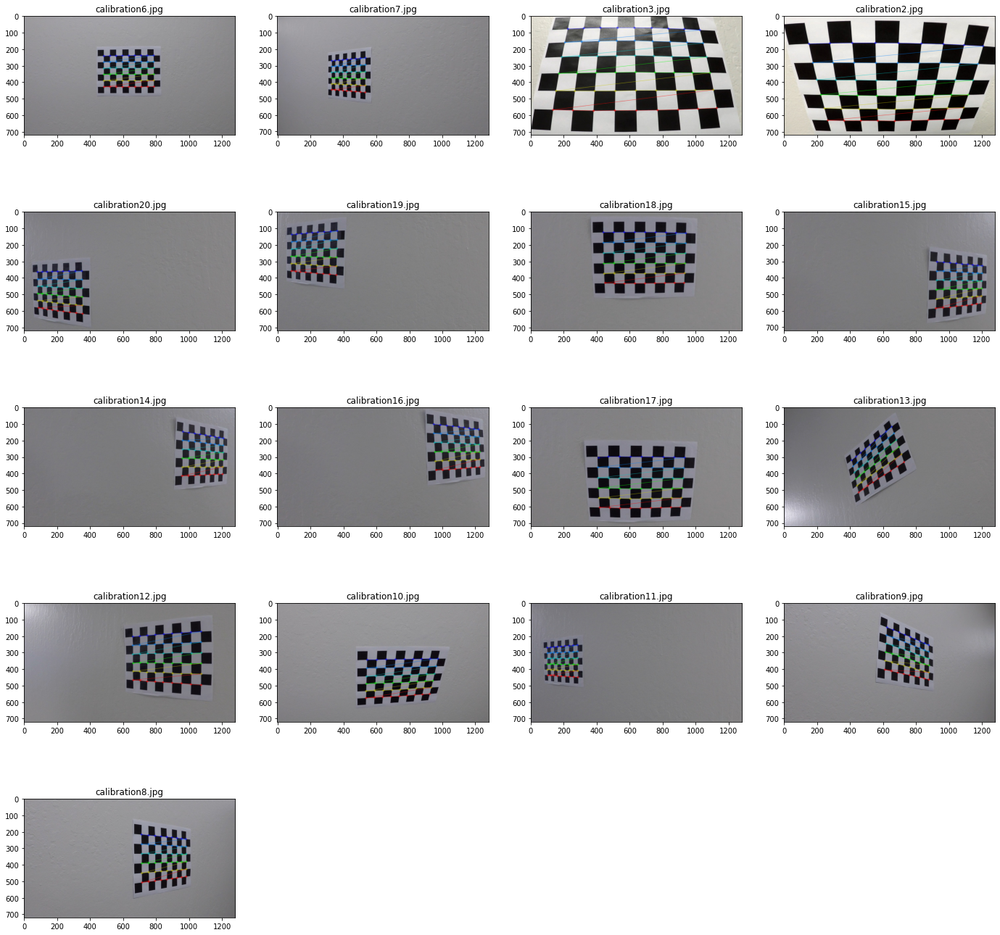

In [3]:
# Initialize calibration and undistortion image paths
cal_src = 'camera_cal/'
test_src = 'test_images/'
draw_dest = 'output_images/chessboard_drawn/'
cal_images = os.listdir(cal_src)

# Chessboard corners size
nx = 9
ny = 6

# Arrays to store object points & image points
objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image space

# Prepare object points: (x, y, z)
objp = np.zeros((nx*ny, 3), np.float32) # There are 6 by 9 corners on the chessboard of the calibration image
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) # This meshgrid returns 54 rows of (x, y) coordinates

# Obtain corner coordinates in all calibration images
## Setting Inline Visualization
fig = plt.figure(figsize=(24, 24))
i = 1
for img_path in cal_images:
    # Read the image file
    img = mpimg.imread(cal_src + img_path)

    # Convert image to grey
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Find chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # Append corners to image points and the corresponding object points
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
        # Draw images and save it
        drawn = draw_corners(img, nx, ny, corners, ret)
        
        # Visualize Output
        fig.add_subplot(5, 4, i)
        plt.title(img_path)
        plt.imshow(drawn)

        # Iterate i for Visualization
        i += 1
        
        # Save the drawn image to output directory
        mpimg.imsave(draw_dest + 'drawn_' + img_path, drawn)

# Obtain calibration parameters
ret, mtx, dist, rvecs, tvecs = calibrate_camera(img.shape, objpoints, imgpoints)

### Undistort Calibration and Test Images

In [4]:
# Define test images and output path
test_images = os.listdir(test_src)
test_undist_out = 'output_images/undistorted/test_images/'
cal_undist_out = 'output_images/undistorted/cal_images/'

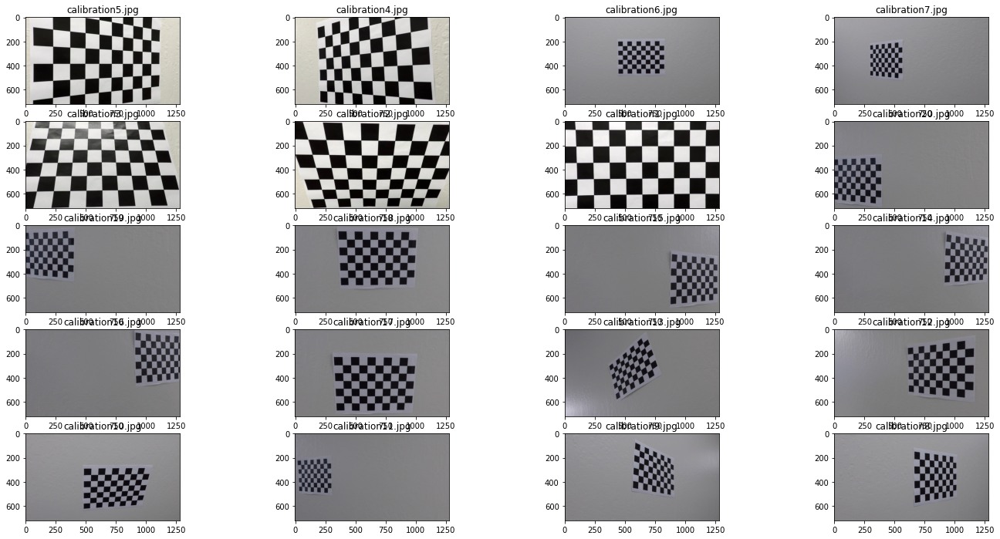

In [6]:
# Undistort the calibration images
# Setting Inline Visualization
fig = plt.figure(figsize=(24, 12))
i = 1 # Counter for the visualization
for img_path in cal_images:
    img = mpimg.imread(cal_src + img_path)
    undist = undistort(img, mtx, dist)
    
    # Visualize Output
    fig.add_subplot(5, 4, i)
    plt.title(img_path)
    plt.imshow(undist)

    # Iterate i for Visualization
    i += 1
    
    # Save the undistorted image to output directory
    mpimg.imsave(cal_undist_out + 'undistorted_' + img_path, undist)

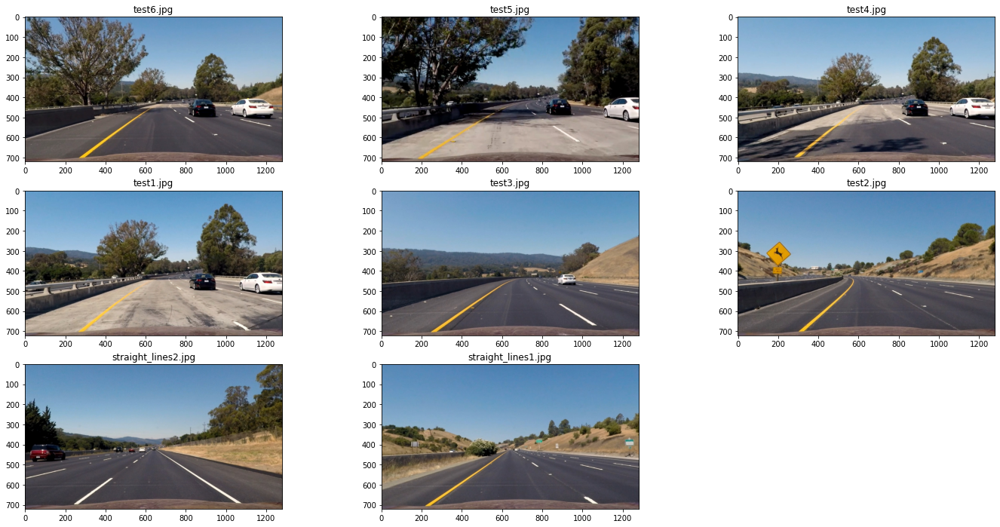

In [7]:
# Undistort the test images
# Setting Inline Visualization
fig = plt.figure(figsize=(24, 12))
i = 1 # Counter for the visualization
for img_path in test_images:
    img = mpimg.imread(test_src + img_path)
    undist = undistort(img, mtx, dist)
    
    # Visualize Output
    fig.add_subplot(3, 3, i)
    plt.title(img_path)
    plt.imshow(undist)

    # Iterate i for Visualization
    i += 1
    
    # Save the undistorted image to output directory
    mpimg.imsave(test_undist_out + 'undistorted_' + img_path, undist)

#### Calibration Image Comparison: Original Image vs Undistorted Image

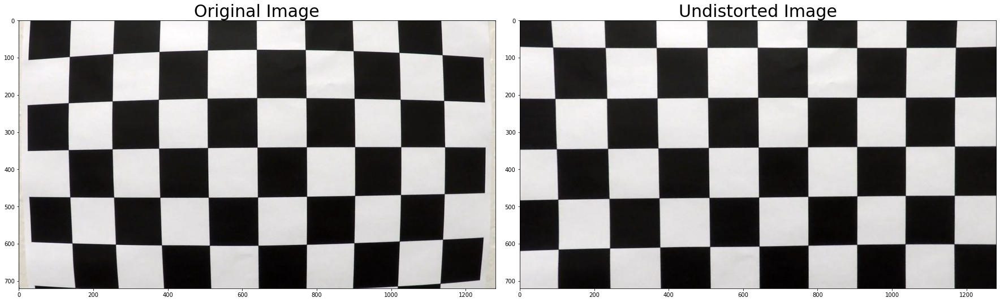

In [8]:
f, axislist = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
axislist[0].imshow(mpimg.imread(cal_src + 'calibration1.jpg'))
axislist[0].set_title('Original Image', fontsize=30)
axislist[1].imshow(mpimg.imread(cal_undist_out + 'undistorted_calibration1.jpg'))
axislist[1].set_title('Undistorted Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


## 2. Color and Gradient Threshold
***

### Testing on one test image first

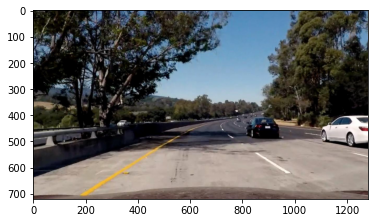

In [9]:
grad_test_img = mpimg.imread(test_undist_out + '/undistorted_test5.jpg')
plt.imshow(grad_test_img);

### Testing Color and Gradient Functions

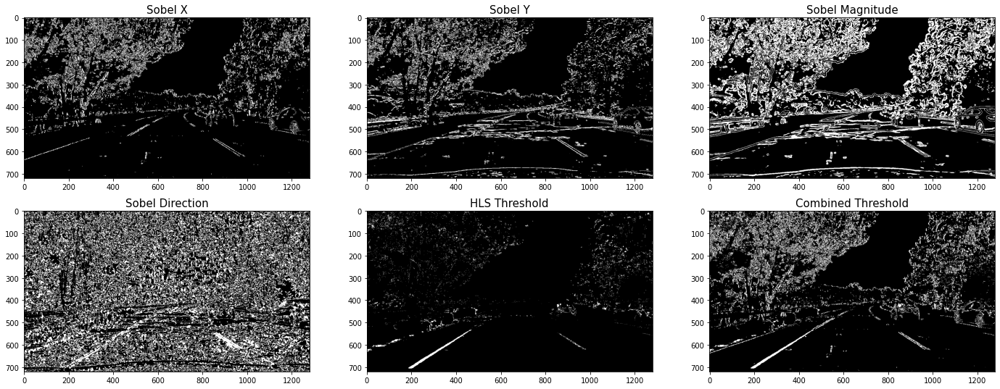

In [15]:
# Choose a Sobel kernel size
ksize = 15 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(grad_test_img, orient='x', sobel_kernel=ksize, thresh=(20, 60))
grady = abs_sobel_thresh(grad_test_img, orient='y', sobel_kernel=ksize, thresh=(20, 60))
mag_binary = mag_thresh(grad_test_img, sobel_kernel=ksize, mag_thresh=(20, 60))
dir_binary = dir_threshold(grad_test_img, sobel_kernel=ksize, thresh=(0.7, 1.3))
hls_binary = hls_select(grad_test_img, thresh=(170, 250))

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) | (hls_binary == 1))] = 1

# Visualize the thresholded images
thresh_list = [gradx, grady, mag_binary, dir_binary, hls_binary, combined]
thresh_name = ['Sobel X', 'Sobel Y', 'Sobel Magnitude', 'Sobel Direction', 'HLS Threshold', 'Combined Threshold']
fig = plt.figure(figsize=(24, 9))
i = 1
for img in thresh_list:
    # Visualize Output
    fig.add_subplot(2, 3, i)
    plt.title(thresh_name[i-1], fontsize=15)
    plt.imshow(img, cmap='gray')
    i += 1 # Iterate counter

### Define Threshold Combination Function and Apply to Test Images

In [16]:
# Function to combine thresholds
def combined_threshold(img):
    """
    Filtering image with Sobel and Color threshold and output binary image.
    ___
    
    INPUT:
        img - An image object to be filtered
    OUTPUT:
        combined - A binary thresholded image
    """
    ksize = 15
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(20, 60))
    hls_binary = hls_select(img, thresh=(170, 250))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) | (hls_binary == 1))] = 1
    
    return combined

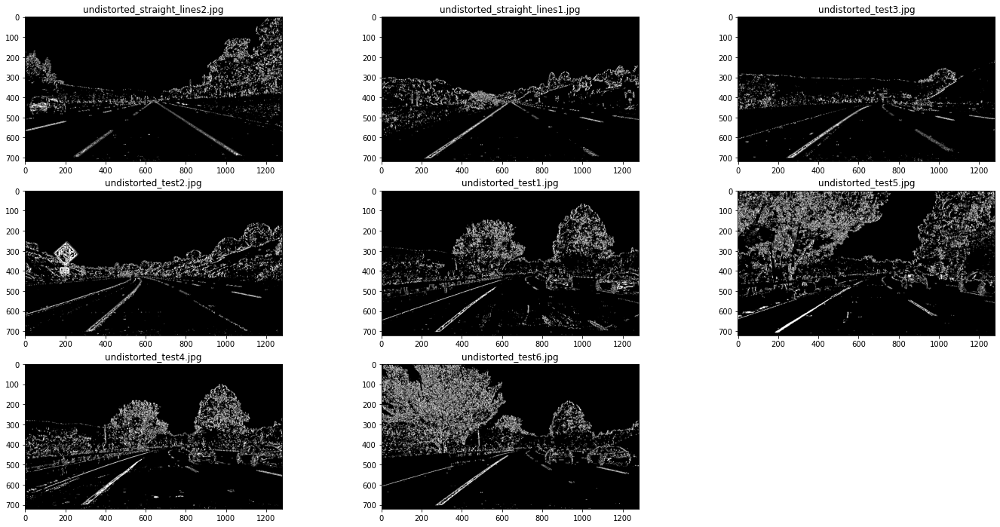

In [17]:
test_images_undistorted = os.listdir(test_undist_out)
test_grad_out = 'output_images/color_gradient_threshold/'

## Setting Inline Visualization
fig = plt.figure(figsize=(24, 12))
i = 1 # counter for visualization

for img_path in test_images_undistorted:
    img = mpimg.imread(test_undist_out + img_path)
    undist_binary = combined_threshold(img)
    
    # Visualize Output
    fig.add_subplot(3, 3, i)
    plt.title(img_path)
    plt.imshow(undist_binary, cmap='gray')

    # Iterate i for Visualization
    i += 1
    
    # Save image to output directory
    plt.imsave(test_grad_out + 'undist_bin_' + img_path[12:], undist_binary, cmap='gray')

## 3. Perspective Transform

***

### Testing on One Test Image and Obtain Matrix Transformation

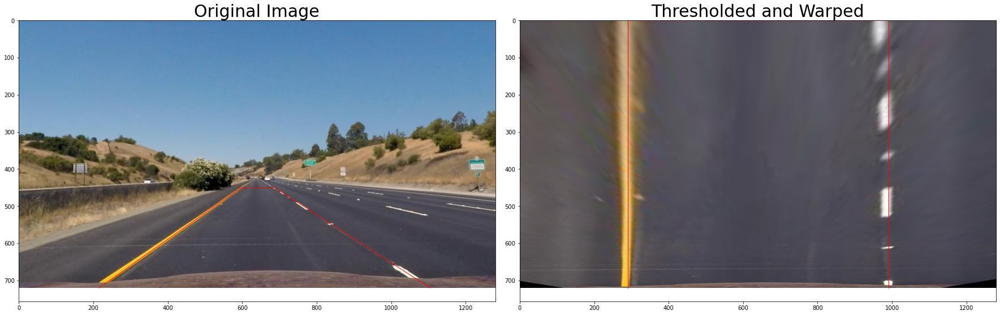

In [21]:
# Store test image to be tested upon
pers_trans_img = mpimg.imread('output_images/undistorted/test_images/undistorted_straight_lines1.jpg')

# Set the X & Y coordinates to obtain the matrix transformation
x_src = [215, 597, 687, 1105]
y_src = [720, 450, 450, 720]
src_coors = np.float32([(x_src[0],y_src[0]),\
                        (x_src[1],y_src[1]),\
                        (x_src[2],y_src[2]),\
                        (x_src[3],y_src[3])])
dst_coors = np.float32([(290, y_src[0] ),\
                        (290, 0),\
                        (990, 0),\
                        (990, y_src[3])])

# Get the matrix transformation
M = getTransformMatrix(pers_trans_img, src_coors, dst_coors)

# Transform example image
img_bird_eye = transformPerspective(pers_trans_img, M)

# Visualize the comparison before and after perspective transformation
## Location of the two straight lines
x_dest = [290, 290, 990, 990]
y_dest = [720, 0, 0, 720]
## Plot two images in one figure
f, axislist = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
axislist[0].imshow(pers_trans_img)
axislist[0].plot(x_src, y_src, 'r-', lw=1)
axislist[0].set_title('Original Image', fontsize=30)
axislist[1].imshow(img_bird_eye, cmap='gray')
axislist[1].plot(x_dest, y_dest, 'r-', lw=1)
axislist[1].set_title('Thresholded and Warped', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Apply the Transformation to the Thresholded Images

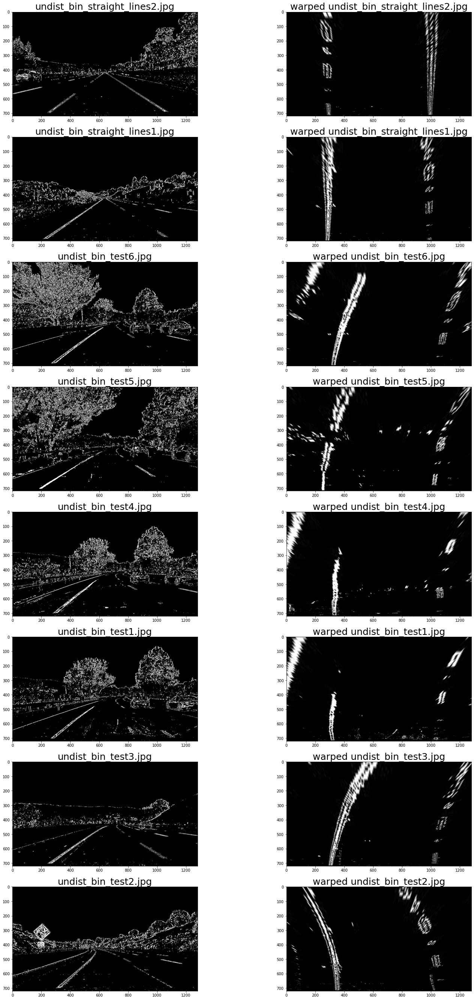

In [22]:
test_images_grad = os.listdir(test_grad_out)
test_warped_out = 'output_images/binary_warped/'

## Setting Inline Visualization
fig = plt.figure(figsize=(24, 48))
i = 1 # counter for the visualization
for img_path in test_images_grad:
    img = mpimg.imread(test_grad_out + img_path)
    warped_bin = transformPerspective(img, M)
    
    # Visualize Output
    ## For the gradient threshold image
    fig.add_subplot(8, 2, i)
    plt.title(img_path, fontsize=25)
    plt.imshow(img, cmap='gray')
    i += 1
    
    ## For the warped image
    fig.add_subplot(8, 2, i)
    plt.title('warped ' + img_path, fontsize=25)
    plt.imshow(warped_bin, cmap='gray')
    i += 1
    
    # Save image to output directory
    plt.imsave(test_warped_out + 'warped_' + img_path[11:], warped_bin, cmap='gray')

## 4. Lane Finding

***

### 4.0. Create Line Classes to Help in Video Processing

In [60]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        #x values of the current fitted line
        self.current_fitx = None
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

# Define a LeftLine child class to store prior X fitted coordinates and
# how many times a LeftLine failed to be found
class LeftLine(Line):
    # Use class variable to save prior lines
    prev_xfitted = []
    # Use class variable to save counts of failed attempts to find lane
    fail_count = 0
    def __init__(self):
        # Inherit parent
        Line.__init__(self)
        self.recent_xfitted = LeftLine.prev_xfitted
        # If recent_xfitted not empty
        if self.recent_xfitted:
            # Average 3 prior best fits
            self.bestx = np.array(self.recent_xfitted[-5:]).mean(axis=0).astype(int)
            ploty = np.linspace(0, 719, 720)
            self.best_fit = np.polyfit(ploty, self.bestx, 2)

# Define a RightLine child class to store prior X fitted coordinates and
# how many times a RightLine failed to be found
class RightLine(Line):
    # Use class variable to save prior lines
    prev_xfitted = []
    # Use class variable to save counts of failed attempts to find lane
    fail_count = 0
    def __init__(self):
        # Inherit parent
        Line.__init__(self)
        self.recent_xfitted = RightLine.prev_xfitted
        # If recent_xfitted not empty
        if self.recent_xfitted:
            # Average up to 3 prior best fits
            self.bestx = np.array(self.recent_xfitted[-5:]).mean(axis=0).astype(int)
            ploty = np.linspace(0, 719, 720)
            self.best_fit = np.polyfit(ploty, self.bestx, 2)

### 4.1. Applying Sliding Windows on Test Images

In [27]:
# A function applying sliding windows to the test images and returns image with windows drawn
def sliding_window_lane_find(img, M):
    """
    A pipeline to apply sliding windows to the test images.
    Return an image with lane lines and windows drawn.
    ___
    
    INPUTS:
        img - An undistorted image object
        M - Matrix transformation
    OUTPUT:
        out_img - An image object with lane lines found and sliding windows drawn
    """
    # Instantiate Lines
    left = Line()
    right = Line()
    
    # Apply Gradient and Color Threshold
    grad = combined_threshold(img)
    
    # Apply Perspective Transform
    bird_eye = transformPerspective(grad, M)
    
    # Find our lane pixels first
    left, right, out_img = sw_find_lane_with_window(bird_eye, left, right)
    
    # Generate x and y values for plotting
    left, right = fit_poly(out_img.shape, left, right)
    
    # Visualization
    out_img = draw_lane_px(out_img, left.allx, left.ally, right.allx, right.ally) # Colors in the left and right lane regions
    out_img = draw_fit_lines(out_img, left.current_fitx, right.current_fitx) # Draw polynomial lane lines on the image
    
    return out_img

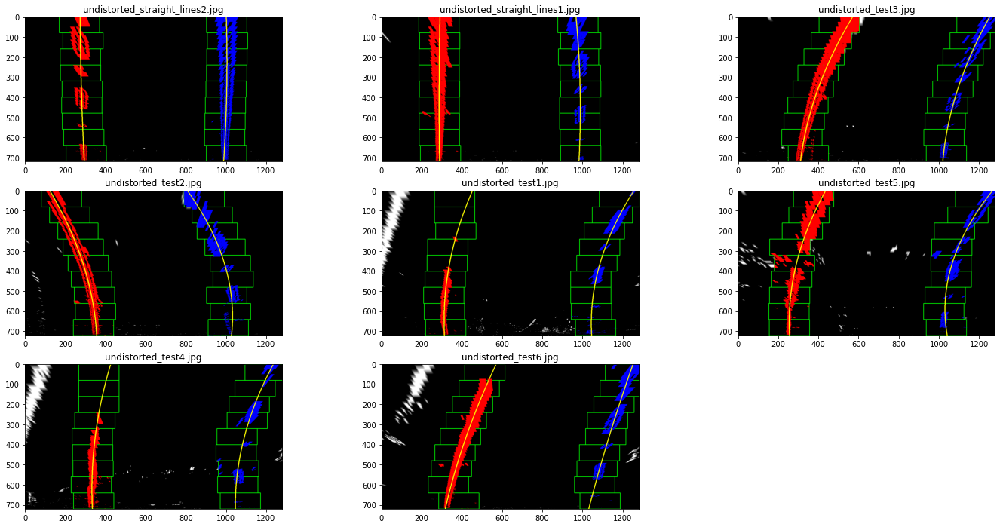

In [28]:
# Define path for the outputs
sliding_window_out = 'output_images/sliding_windows/'

# Apply Sliding Window Lane Finding to Test Images

# Setting Inline Visualization
fig = plt.figure(figsize=(24, 12))
i = 1 # counter for the visualization
for img_path in test_images_undistorted:
    
    img_test = mpimg.imread(test_undist_out + img_path)
    slide_window_out = sliding_window_lane_find(img_test, M)
    
    # Visualize Output
    fig.add_subplot(3, 3, i)
    plt.title(img_path)
    plt.imshow(slide_window_out)
    i += 1 # Iterate i for the next image
    
    # Save image to output directory
    mpimg.imsave(sliding_window_out + 'sliding_window_' + img_path[12:], slide_window_out)

### 4.2. Applying Sliding Windows with No Window Drawn

In [29]:
# A function applying sliding windows and returning images with no windows drawn and no other white pixels
def sw_lane_find_pipe(img, M):
    """
    A pipeline to apply sliding windows to the test images.
    Return an image with lane lines drawn
    ___
    
    INPUTS:
        img - An undistorted image object
        M - Matrix transformation
    OUTPUT:
        out_img - An image object with lane lines found drawn
    """
    # Instantiate Lines
    left = Line()
    right = Line()
    
    # Apply Gradient and Color Threshold
    grad = combined_threshold(img)
    
    ## Apply Perspective Transform
    bird_eye = transformPerspective(grad, M)
    
    # Apply Sliding Window Lane Finding
    
    # Create an output image to draw on and visualize the result
    out_img = np.uint8(np.dstack((bird_eye, bird_eye, bird_eye))*255)
    
    # Find our lane pixels first
    left, right = sw_find_lane_pixel(bird_eye, left, right)

    # Generate x and y values for plotting
    left, right = fit_poly(out_img.shape, left, right)

    # Visualization
    out_img = draw_lane_px(out_img, left.allx, left.ally, right.allx, right.ally) # Colors in the left and right lane regions
    out_img = draw_fit_lines(out_img, left.current_fitx, right.current_fitx) # Draw polynomial lane lines on the image
    
    return out_img

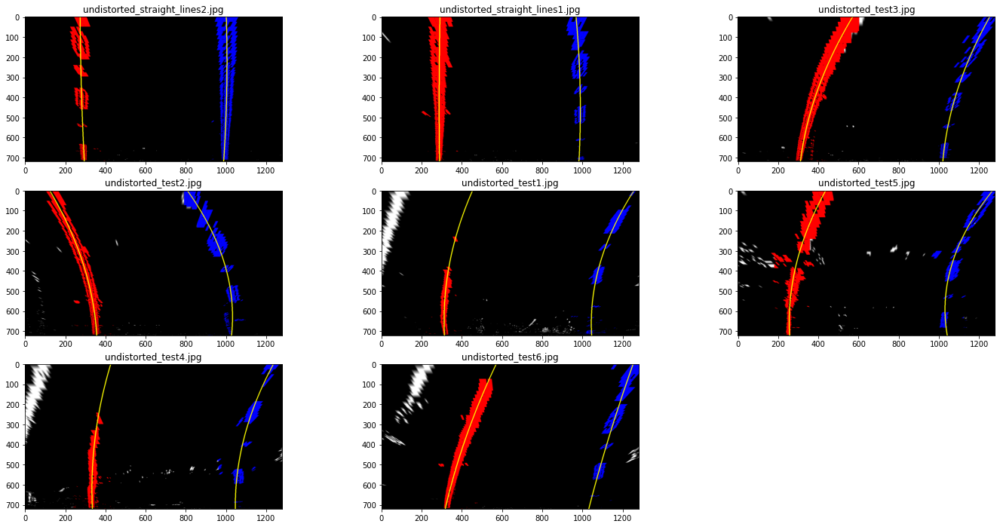

In [30]:
# Define path for the output
sw_lane_find_dest = 'output_images/sliding_windows_lane/'

# Apply Sliding Window Lane Finding to Test Images

# Setting Inline Visualization
fig = plt.figure(figsize=(24, 12))
i = 1 # counter for the visualization
for img_path in test_images_undistorted:
    
    img_test = mpimg.imread(test_undist_out + img_path)
    sw_img = sw_lane_find_pipe(img_test, M)
    
    # Visualize Output
    fig.add_subplot(3, 3, i)
    plt.title(img_path)
    plt.imshow(sw_img)
    i += 1 # Iterate i for the next image
    
    # Save image to output directory
    mpimg.imsave(sw_lane_find_dest + 'sw_lane_' + img_path[12:], sw_img)

### 4.3. Applying Sliding Windows with Road Drawn on Test Images 

In [31]:
# A function applying sliding windows and returning images with road drawn and no other white pixels
def sw_road(img, M):
    """
    A pipeline to apply sliding windows to the test images.
    Return an image with lane lines and the road drawn.
    ___
    
    INPUTS:
        img - An undistorted image object
        M - Matrix transformation
    OUTPUT:
        out_img - An image object with lane lines found and the road drawn
    """
    # Instantiate Lines
    left = Line()
    right = Line()
    
    # Apply Gradient and Color Threshold
    grad = combined_threshold(img)
    
    ## Apply Perspective Transform
    bird_eye = transformPerspective(grad, M)
    
    ### Apply Sliding Window Lane Finding ###
    
    # Create an output image to draw on and visualize the result
    warp_zero = np.zeros_like(bird_eye).astype(np.uint8)
    out_img = np.dstack((warp_zero, warp_zero, warp_zero)) # out_img as a blank black image for the lane line to be drawn on
    road_img = np.zeros_like(out_img) # window_img as blank black image for the lane to be drawn on
    
    # Find our lane pixels first
    left, right = sw_find_lane_pixel(bird_eye, left, right)

    # Generate x and y values for plotting
    left, right = fit_poly(out_img.shape, left, right)

    ### Visualization ###
    out_img = draw_lane_px(out_img, left.allx, left.ally, right.allx, right.ally) # Colors in the left and right lane regions
    road_img = draw_road(road_img, left.current_fitx, right.current_fitx) # Draw the road  
    result = cv2.addWeighted(out_img, 1, road_img, 0.3, 0) # Overlay the road image onto the warped lane image
    
    return result

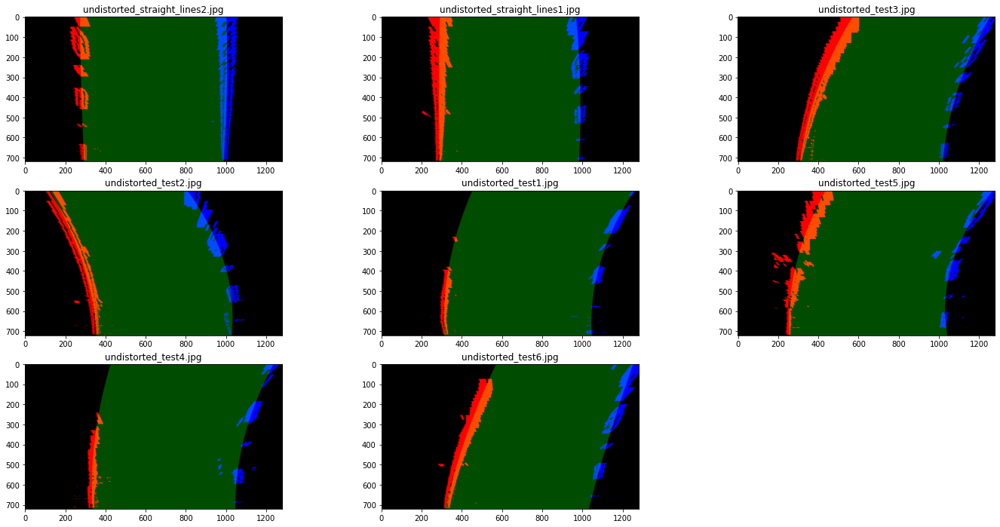

In [32]:
# Define path for the outputs
lane_find_out = 'output_images/lane_found/'

# Apply Sliding Window Lane Finding to Test Images

# Setting Inline Visualization
fig = plt.figure(figsize=(24, 12))
i = 1 # counter for the visualization
for img_path in test_images_undistorted:
    
    img_test = mpimg.imread(test_undist_out + img_path)
    sw_img = sw_road(img_test, M)
    
    # Visualize Output
    fig.add_subplot(3, 3, i)
    plt.title(img_path)
    plt.imshow(sw_img)
    i += 1 # Iterate i for the next image
    
    # Save image to output directory
    mpimg.imsave(lane_find_out + 'lane_found_' + img_path[12:], sw_img)

### 4.4. Finding Lane with Previously Found Poly Lines

In [33]:
# Pipeline function to apply prior poly lane find to test images
def prior_poly_pipe(img, M):
    """
    A pipeline to search lane around (imitated) prior fitted lane lines.
    Return an image with lane lines and road drawn.
    ___
    
    INPUTS:
        img - An undistorted image object
        M - Matrix transformation
    OUTPUT:
        out_img - An image object with lane lines found and road drawn
    """
    # Instantiate Lines
    left = Line()
    right = Line()
    
    # Apply Gradient and Color Threshold
    grad = combined_threshold(img)
    
    # Apply Perspective Transform
    bird_eye = transformPerspective(grad, M)
    
    # Create an output image to draw on and visualize the result
    warp_zero = np.zeros_like(bird_eye).astype(np.uint8)
    out_img = np.dstack((warp_zero, warp_zero, warp_zero)) # out_img as a blank black image for the lane line to be drawn on
    road_img = np.zeros_like(out_img) # window_img as blank black image for the lane to be drawn on
    
    # Apply Sliding Window to imitate prior fitx and fity
    left, right = sw_find_lane_pixel(bird_eye, left, right)
    left, right = fit_poly(out_img.shape, left, right)
    
    ### Apply Prior Poly Lane Finding ###
    left, right = search_around_poly(bird_eye, left, right)
    
    ### Visualization ###
    out_img = draw_lane_px(out_img, left.allx, left.ally, right.allx, right.ally) # Colors in the left and right lane regions
    road_img = draw_road(road_img, left.current_fitx, right.current_fitx) # Draw the road  
    result = cv2.addWeighted(out_img, 1, road_img, 0.3, 0) # Overlay the road image onto the warped lane image
    
    return result

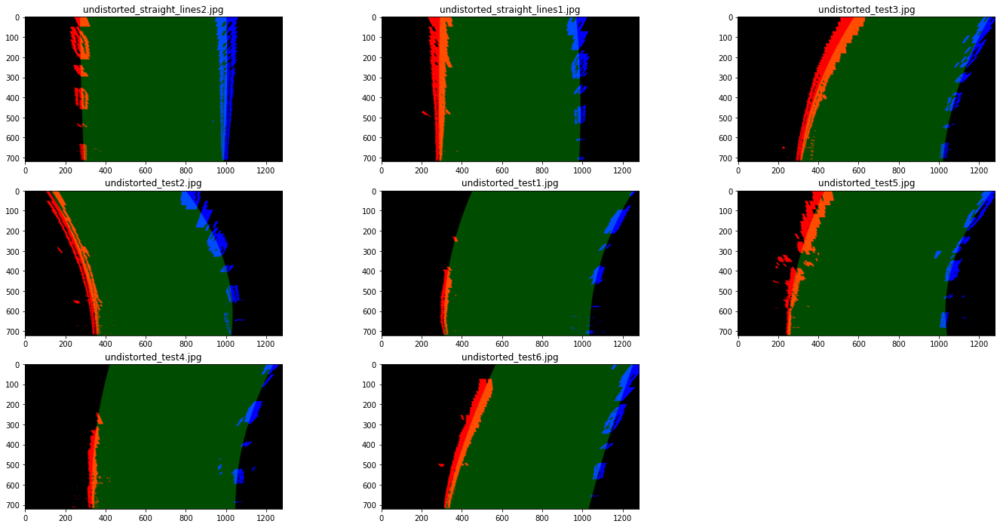

In [36]:
# Path for the outputs
prior_poly_out = 'output_images/prior_poly/'

# Apply Search Around Poly Lane Finding to Test Images

# Setting Inline Visualization
fig = plt.figure(figsize=(24, 12))
i = 1 # counter for the visualization
for img_path in test_images_undistorted:
    
    img_test = mpimg.imread(test_undist_out + img_path)
    find_poly_img = prior_poly_pipe(img_test, M)
    
    # Visualize Output
    fig.add_subplot(3, 3, i)
    plt.title(img_path)
    plt.imshow(find_poly_img)
    
    # Save image to output directory
    mpimg.imsave(prior_poly_out + 'prior_poly_' + img_path[12:], find_poly_img)
    
    # Iterate i for Visualization
    i += 1

## 5. Curvature and Position Finding

### Pipeline to output binary warped images with curvature and vehicle position drawn

In [37]:
# Pipeline function to apply SW and curvature and position find to test images
def sw_with_curv_pipe(img, M):
    """
    Find lane and curvature and the vehicle position from an undistorted image.
    Return a warped binary image with lane and curvature and position drawn.
    ___
    
    INPUTS:
        img - An image object
        M - A matrix transformation
    OUTPUT:
        result - An image with lane and information drawn
    """
    # Instantiate Lines
    left = Line()
    right = Line()
    
    # Apply Gradient and Color Threshold
    grad = combined_threshold(img)
    
    # Apply Perspective Transform
    bird_eye = transformPerspective(grad, M)
    
    ### Apply Sliding Window Lane Finding ###
    
    # Create an output image to draw on and visualize the result
    warp_zero = np.zeros_like(bird_eye).astype(np.uint8)
    out_img = np.dstack((warp_zero, warp_zero, warp_zero)) # out_img as a blank black image for the lane line to be drawn on
    road_img = np.zeros_like(out_img) # window_img as blank black image for the lane to be drawn on
    
    # Find our lane pixels first
    left, right = sw_find_lane_pixel(bird_eye, left, right)

    # Generate x and y values for plotting
    left, right = fit_poly(out_img.shape, left, right)
    
    # Get curvature and offset
    left_curverad, right_curverad = measure_curvature_real(left, right)
    left, right, offset = vehicle_offset(out_img.shape, left, right)

    ### Visualization ###
    out_img = draw_lane_px(out_img, left.allx, left.ally, right.allx, right.ally) # Colors in the left and right lane regions
    road_img = draw_road(road_img, left.current_fitx, right.current_fitx) # Draw the road  
    overlaid_img = cv2.addWeighted(out_img, 1, road_img, 0.3, 0) # Overlay the road image onto the out_img
    result = draw_curv_pos_text(overlaid_img, left.radius_of_curvature, right.radius_of_curvature, offset)
    
    return result

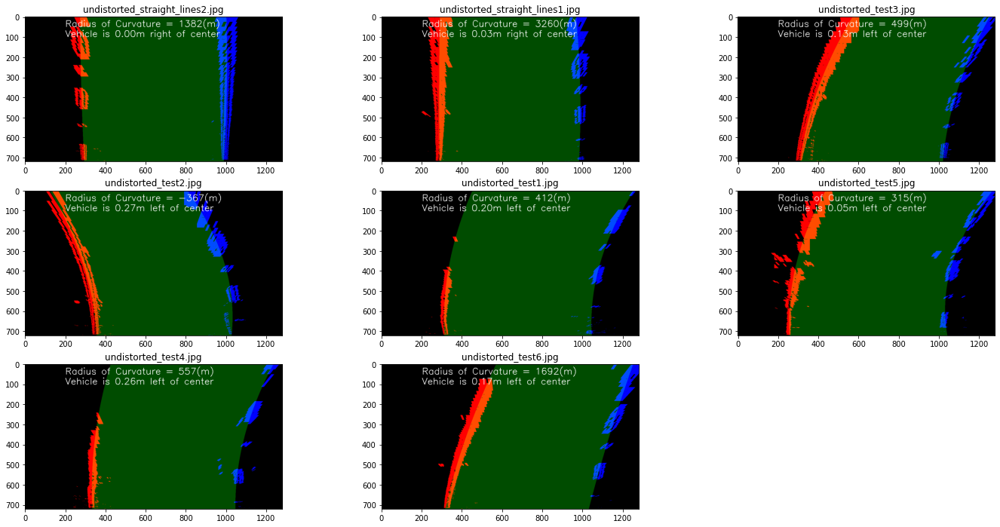

In [38]:
# Define path for the outputs
sw_cur_out = 'output_images/curvature_position/'

# Apply Search Around Poly Lane Finding to Test Images

# Setting Inline Visualization
fig = plt.figure(figsize=(24, 12))
i = 1 # counter for the visualization
for img_path in test_images_undistorted:
    
    img_test = mpimg.imread(test_undist_out + img_path)
    sw_cur_img = sw_with_curv_pipe(img_test, M)
    
    # Visualize Output
    fig.add_subplot(3, 3, i)
    plt.title(img_path)
    plt.imshow(sw_cur_img)
    
    # Save image to output directory
    mpimg.imsave(sw_cur_out + 'sw_cur_' + img_path[12:], sw_cur_img)
    
    # Iterate i for Visualization
    i += 1

## 6. Lane Unwarp
***

In [39]:
# Pipeline function to apply SW to test images and
# return annotated images with lane, road and curvature & position found
def unwrap_lane_pipe(img, M, Minv):
    """
    Find lane and curvature and the vehicle position from an undistorted image.
    Return a warped binary image with lane and curvature and position drawn.
    ___
    
    INPUTS:
        img - An image object
        M - A matrix transformation
    OUTPUT:
        result - An image with lane and information drawn
    """
    # Instantiate Lines
    left = Line()
    right = Line()
    
    # Apply Gradient and Color Threshold
    grad = combined_threshold(img)
    
    # Apply Perspective Transform
    bird_eye = transformPerspective(grad, M)
    
    ### Apply Sliding Window Lane Finding ###
    
    # Create an output image to draw on and visualize lane and road
    warp_zero = np.zeros_like(bird_eye).astype(np.uint8)
    out_img = np.dstack((warp_zero, warp_zero, warp_zero)) # out_img as a blank black image for the lane line to be drawn on
    road_img = np.zeros_like(out_img) # window_img as blank black image for the lane to be drawn on
    
    # Find our lane pixels first
    left, right = sw_find_lane_pixel(bird_eye, left, right)

    # Generate x and y values for plotting
    left, right = fit_poly(out_img.shape, left, right)
    
    # Get curvature and offset
    left, right = measure_curvature_real(left, right)
    left, right, offset = vehicle_offset(out_img.shape, left, right)

    ### Visualization ###
    out_img = draw_lane_px(out_img, left.allx, left.ally, right.allx, right.ally) # Colors in the left and right lane regions
    road_img = draw_road(road_img, left.current_fitx, right.current_fitx) # Draw the road  
    road_lane_img = cv2.addWeighted(out_img, 1, road_img, 0.3, 0) # Overlay the road image onto the out_img
    
    # Overlay lane to initial image with perspective transform
    inverse_lane = transformPerspective(road_lane_img, Minv) # Inverse transform
    overlaid_img = cv2.addWeighted(img, 1, inverse_lane, 1, 0) # Overlay lane to initial image
    
    result = draw_curv_pos_text(overlaid_img, left.radius_of_curvature, right.radius_of_curvature, offset)
    
    return result

### Obtain Inverse Transformation Matrix

In [40]:
# Obtain inverse transformation matrix
Minv = getTransformMatrix(pers_trans_img, dst_coors, src_coors)

### Test it on one test image

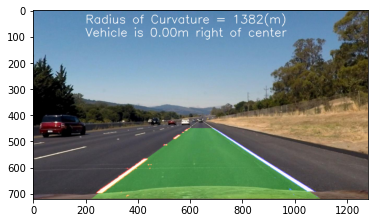

In [41]:
test_unwrap = mpimg.imread(test_undist_out + 'undistorted_straight_lines2.jpg')
out_unwrap = unwrap_lane_pipe(test_unwrap, M, Minv)

plt.imshow(out_unwrap)

### Apply it to all test images

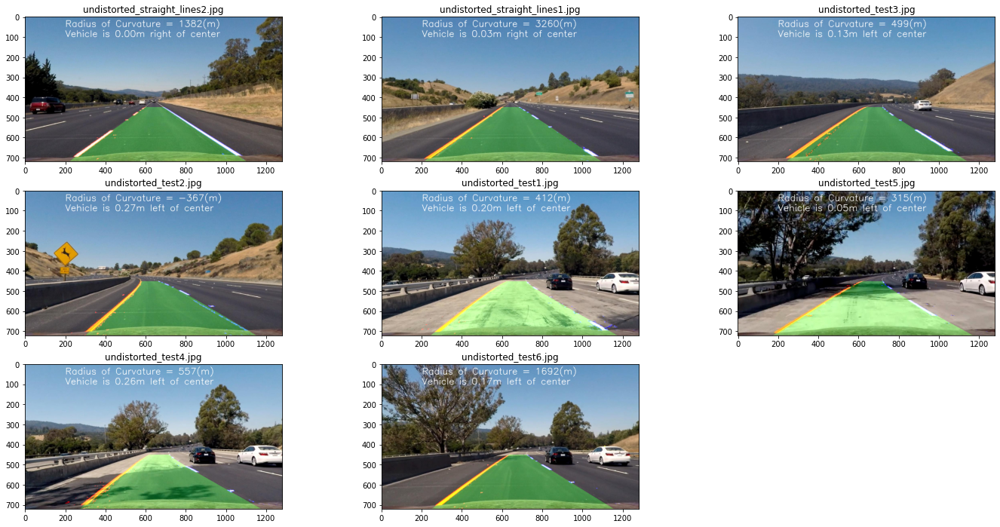

In [42]:
# APPLY SW AND RETURN ANNOTATED TEST IMAGES WITH LANE, ROAD, AND CURVATURE

# Define path for the outputs
unwrap_lane_dst = 'output_images/unwraped/'

# Apply Search Around Poly Lane Finding to Test Images

# Setting Inline Visualization
fig = plt.figure(figsize=(24, 12))
i = 1 # counter for the visualization
for img_path in test_images_undistorted:
    
    img_test = mpimg.imread(test_undist_out + img_path)
    unwrap_img = unwrap_lane_pipe(img_test, M, Minv)
    
    # Visualize Output
    fig.add_subplot(3, 3, i)
    plt.title(img_path)
    plt.imshow(unwrap_img)
    i += 1 # Iterate for the next image
    
    # Save image to output directory
    mpimg.imsave(unwrap_lane_dst + 'unwraped_' + img_path[12:], unwrap_img)

## 7. Full Pipeline for the Videos
***

### Define Sanity Check Functions

In [43]:
def sanity_check(left, right):
    """
    Apply sanity check to the left and right lane lines.
    ___
    
    INPUTS:
        left - A line object of the left lane
        right - A line object of the right lane
    OUTPUTS:
        A boolean of whether the lines are sane.
    """
    ### 1. Similar Curvature
    curvature_diff = abs(left.radius_of_curvature - right.radius_of_curvature)
    same_curvature = curvature_diff < 3000

    ### 2. Right Distance Horizontally
    lane_distance = left.line_base_pos + right.line_base_pos
    sane_distance = (lane_distance > 2.9) & (lane_distance < 4.5) # between 2.9 & 4.5 meters
    
    return same_curvature & sane_distance

### Define Functions to Abstract some Steps in the Pipeline

In [44]:
def get_curv_pos(img_shape, left, right):
    """
    Get both curvature of the lane and the offset of the vehicle from the lane center.
    ___
    
    INPUTS:
        img_shape - An iterable containing the shape of the original image
        left - A line object for the left lane
        right - A line object for the right lane
    OUTPUTS:
        left - A line object for the left lane where the curvature info has been saved
        right - A line object for the right lane where the curvature info has been saved
        offest - A float of the vehicle offset distance from the lane center
    """
    left, right = measure_curvature_real(left, right)
    left, right, offset = vehicle_offset(img_shape, left, right)
    return left, right, offset

def sw_full(bird_eye, img_shape, left, right):
    """
    Apply sliding windows to find lane pixel and find the fitted lines.
    ___
    
    INPUTS:
        bird_eye - A binary image object for the lane to be found
        img_shape - An iterable containing the shape of the original image
        left - A line object for the left lane
        right - A line object for the right lane
    OUTPUTS:
        left - A line object
        right - A line object
    """
    # Find lane pixels
    left, right = sw_find_lane_pixel(bird_eye, left, right)
    # Generate x and y values for the polynom line
    left, right = fit_poly(img_shape, left, right)
    return left, right

def draw_full(undist, bird_eye, left, right, offset, lane_found=True):
    """
    Draw the lanes, roads, curvature, and offset into the original image
    ___
    
    INPUTS:
        undist - An image object of the undistorted original image
        bird_eye - A binary image object
        left - A line object for the left lane
        right - A line object for the right lane
        offest - A float of the vehicle offset distance from the lane center
        lane_found - A boolean of whether searh around poly fail n times
    OUTPUTS:
        result - An image object of the annotated undistorted original image
    """
    ## Create an output image to draw on and visualize lane and road
    warp_zero = np.zeros_like(bird_eye).astype(np.uint8)
    out_img = np.dstack((warp_zero, warp_zero, warp_zero)) # out_img as a blank black image for the lane line to be drawn on
    road_img = np.zeros_like(out_img) # window_img as blank black image for the lane to be drawn on
    
    if lane_found:
        # Draw lane and road
        out_img = draw_lane_px(out_img, left.allx, left.ally, right.allx, right.ally) # Colors in the left and right lane regions
        road_img = draw_road(road_img, left.current_fitx, right.current_fitx) # Draw the road  
        road_lane_img = cv2.addWeighted(out_img, 1, road_img, 0.3, 0) # Overlay the road image onto the out_img

        # Overlay lane and road onto the undistorted initial image
        inverse_lane = transformPerspective(road_lane_img, Minv) # Inverse transform
        overlaid_img = cv2.addWeighted(undist, 1, inverse_lane, 1, 0) # Overlay lane to initial image
        
        # Draw curvature and vehicle position on the image
        result = draw_curv_pos_text(overlaid_img, left.radius_of_curvature, right.radius_of_curvature, offset)
    else:
        # Draw only the road previous frame best fitted lines
        road_img = draw_road(road_img, left.bestx, right.bestx) # Draw the road
        inverse_lane = transformPerspective(road_img, Minv) # Inverse transform
        overlaid_img = cv2.addWeighted(undist, 1, inverse_lane, 0.3, 0) # Overlay lane to initial image

        ## Draw curvature and vehicle position on the image
        # The offset and curvature value is obtained from the current lines (so not accurate)
        result = draw_curv_pos_text(overlaid_img, left.radius_of_curvature, right.radius_of_curvature, offset)
    return result

### Define the Full Pipeline Function

In [45]:
# Define a full pipeline
def process_image(img):
    """
    Apply the pipeline of the lane finding algorithm.
    ___
    
    INPUT
        img - An image object
    OUPUT
        result - An undistorted image with lane, road, curvature, and vehicle position annotated 
    """
    # 1. Undistort the image
    undist = undistort(img, mtx, dist)
    
    # 2. Gradient and color threshold
    grad = combined_threshold(undist)
    
    # 3. Perspective transform to bird's eye view
    bird_eye = transformPerspective(grad, M)
    
    # 4. Find lane
    left = LeftLine()
    right = RightLine()
    
    # Find AROUND PRIOR LANES when there is best_fit value
    if (left.bestx is not None) & (right.bestx is not None) & (left.fail_count < 5) & (right.fail_count < 5):
        left, right = search_around_poly(bird_eye, left, right)
        
        # 5. Find curvature and vehicle position
        left, right, offset = get_curv_pos(undist.shape, left, right)

        # 6. Run a sanity check, to validate whether the lines are valid.
        if sanity_check(left, right):
            left.detected = True
            right.detected = True
            left.fail_count = 0
            right.fail_count = 0
            left.prev_xfitted.append(left.current_fitx)
            right.prev_xfitted.append(right.current_fitx)

            # 7. Annotate lane, road, curvature, and vehicle position on undistorted initial image
            result = draw_full(undist, bird_eye, left, right, offset)
        else:
            left.fail_count += 1
            right.fail_count += 1
            
            # Draw only the road from previous frame
            result = draw_full(undist, bird_eye, left, right, offset, lane_found=False)

    # Otherwise (on initial run or when resetting search), run SLIDING WINDOWS
    else:
        left, right = sw_full(bird_eye, undist.shape, left, right)
        left, right, offset = get_curv_pos(undist.shape, left, right) # Find curvature and vehicle position
    
        # 6. Run a sanity check, to validate whether the lines are valid.
        if sanity_check(left, right):
            left.detected = True
            right.detected = True
            left.fail_count = 0
            right.fail_count = 0
            left.prev_xfitted.append(left.current_fitx)
            right.prev_xfitted.append(right.current_fitx)
        else:
            left.fail_count += 1
            right.fail_count += 1

        # 7. Annotate lane, road, curvature, and vehicle position on undistorted initial image
        result = draw_full(undist, bird_eye, left, right, offset)

    # 8. Return the annotated image
    return result

### Test it on one test image

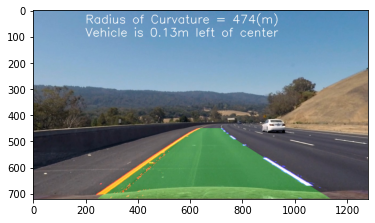

In [46]:
test_full_pipe_img = mpimg.imread('test_images/test3.jpg')
processed_img = process_image(test_full_pipe_img)
plt.imshow(processed_img);

### Processing the video

In [47]:
output_clip_dest = 'output_videos/'
project_clip_path = 'project_video.mp4'
project_clip = VideoFileClip(project_clip_path)

In [51]:
output_clip = project_clip.fl_image(process_image) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output_clip_dest + 'output_' + project_clip_path, audio=False)

t:   0%|          | 2/1260 [00:00<01:30, 13.87it/s, now=None]

Moviepy - Building video output_videos/output_project_video.mp4.
Moviepy - Writing video output_videos/output_project_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos/output_project_video.mp4
CPU times: user 2min 46s, sys: 31.5 s, total: 3min 18s
Wall time: 4min 3s


In [52]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_clip_dest + 'output_' + project_clip_path))

### Challenge Video

In [55]:
challenge_clip_path = 'challenge_video.mp4'
challenge_clip = VideoFileClip(challenge_clip_path)

output_clip = challenge_clip.fl_image(process_image) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output_clip_dest + 'output_' + challenge_clip_path, audio=False)

t:   0%|          | 2/485 [00:00<00:32, 14.98it/s, now=None]

Moviepy - Building video output_videos/output_challenge_video.mp4.
Moviepy - Writing video output_videos/output_challenge_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos/output_challenge_video.mp4
CPU times: user 58.7 s, sys: 11.2 s, total: 1min 9s
Wall time: 1min 25s


In [56]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_clip_dest + 'output_' + challenge_clip_path))

### Harder Challenge Video

In [61]:
harder_challenge_clip_path = 'harder_challenge_video.mp4'
harder_challenge_clip = VideoFileClip(harder_challenge_clip_path)

output_clip = harder_challenge_clip.fl_image(process_image) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output_clip_dest + 'output_' + harder_challenge_clip_path, audio=False)

t:   0%|          | 2/1199 [00:00<01:48, 10.99it/s, now=None]

Moviepy - Building video output_videos/output_harder_challenge_video.mp4.
Moviepy - Writing video output_videos/output_harder_challenge_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos/output_harder_challenge_video.mp4
CPU times: user 2min 41s, sys: 27.3 s, total: 3min 9s
Wall time: 4min 16s


In [62]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_clip_dest + 'output_' + harder_challenge_clip_path))